In [1]:
!pip3 install mat73

  Created wheel for mat73: filename=mat73-0.40-cp36-none-any.whl size=4052 sha256=e8601d0b2416fae163e9fdcb2bd5ad122d11702727a47b3fb52a7aa9d4ad508c
  Stored in directory: /root/.cache/pip/wheels/e4/72/fb/5f606ad9663eb5f4546d8263feb4314cbfd76f70b1d1a0ee21
Successfully built mat73


In [0]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import os
from scipy.io import loadmat
import mat73
from datetime import datetime

In [5]:
import google.colab
google.colab.drive.mount("/content/drive")


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [6]:
import os 
os.listdir('./drive/My Drive/channel_data')

['H_1L3_10km_5ms_1UE_tue.mat', 'plots']

In [0]:
data = mat73.loadmat("./drive/My Drive/channel_data/H_1L3_10km_5ms_1UE_tue.mat")

In [8]:
data['H'][-1].shape

(4, 312, 400)

In [9]:
len(data['H'])

64

## data.keys()

$H$: Frequency domain channel response (antenna domain), $N_t*N_r*N_{sc}*N_{time}$ (Number of base station transmit antennas *UE Number of receive antennas x Number of subcarriers *slot)\\

$H_t$: Time-domain channel response after windowing (antenna domain), $Nt*Nr*Nfft*Ntime$(number of transmit antennas of the base station *UE number of receive antennas *FFT points *slot)

$Pdp$: Non-windowed time domain channel response (antenna domain): $N_{fft}*N_t*N_r*N_{time}$

$Pdpb$: Non-windowed time domain channel response (beam domain): $N_{fft}*N_t*N_r*N_{time}$

$Presnr$: SINR before SRS balancing (antenna domain), $N_t*N_r*N_{time}$

$Presnrb$: SINR before SRS equalization (antenna domain),$ N_t*N_r*N_{time}$

$Rsrpb$: SRS beam RSRP, $N_t*N_r*N_{time}$

$Ta$: SRS timing estimation result, $N_r*N_{time}$

$Noise$: SRS noise estimation result. Nt*2*Ntime (The average noise of each 2port is calculated.)

In [0]:
def get_H_one_UE(data, if_module=True):
    modules = data['H']
    modules = np.concatenate(modules, axis=2)
    return np.abs(modules) if if_module else np.angle(modules)

def plot_signals(data, num_of_subands, sub_band_step=10, sub_band_size=2, time_step=30, ue=0):
    plt.figure(figsize=(16,8))
    x = np.arange(0, data[ue,0].shape[-1], time_step)
    for i in range(num_of_subands):
        plt.plot(x, sub_band_size*i + data[ue,i*sub_band_step][::time_step], linewidth=2,\
                 label=f"sub_band={i*sub_band_step}")
    plt.legend()
    plt.grid()

In [0]:
all_H_modules = get_H_one_UE(data)
all_H_angulars = get_H_one_UE(data,if_module=False)

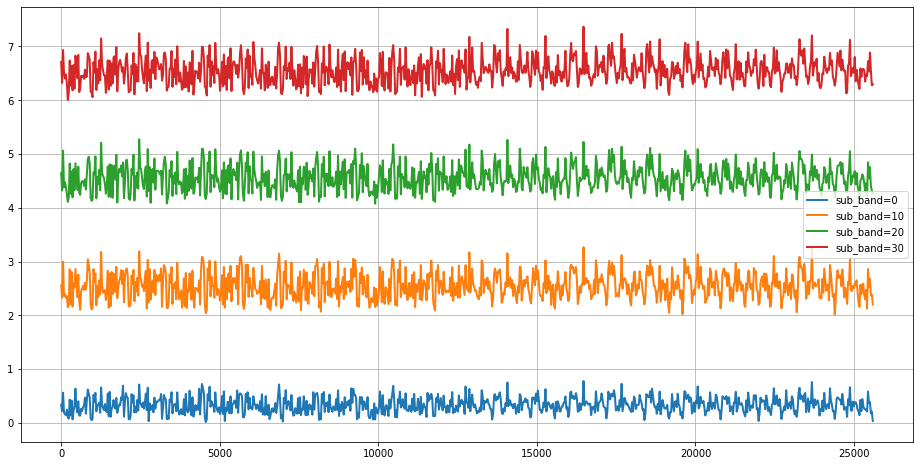

In [12]:
plot_signals(all_H_modules, 4)

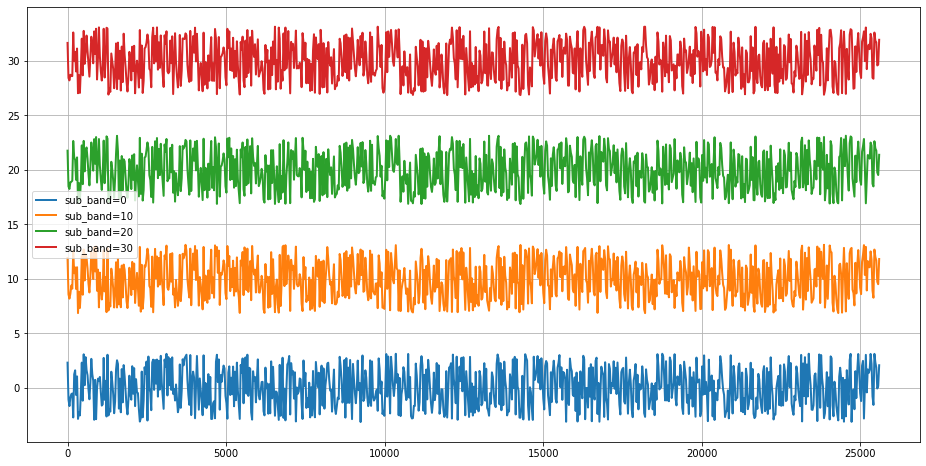

In [13]:
plot_signals(all_H_angulars, 4, sub_band_size=10)

In [0]:
def split_train_val_test(data, train_ratio=.7, val_ratio=.2):
    whole_serice_len = data.shape[-1]
    assert train_ratio < 1 and val_ratio < 1 and train_ratio+val_ratio <= 1
    split_index_train = int(whole_serice_len * train_ratio)
    split_index_val = split_index_train + int(whole_serice_len * val_ratio)
    return data[:, :, :split_index_train], data[:, :, split_index_train:split_index_val],\
        data[:, :, split_index_val:]


def get_time_one_seriese(data, ue=0, sc=0):
    return data[ue, sc, :]

def count_mse(y_pred, y_true):
    return ((y_true-y_pred)**2).mean()
def count_nmse(y_pred, y_true):
    return ((y_true-y_pred)**2 / y_true**2).mean()


def setup_experiment(title, logdir="./tb"):
    experiment_name = "{}@{}".format(title, datetime.now().strftime("%d.%m.%Y-%H:%M:%S"))
    writer = SummaryWriter(log_dir=os.path.join(logdir, experiment_name))
    best_model_path = f"{title}.best.pth"
    return writer, experiment_name, best_model_path

def plot_results(true, pred, step, label):
    plt.figure(figsize=(12,8))
    plt.plot(true[::step], color='r', linewidth=2, label='True')
    plt.plot(pred[::step], color='g', linewidth=2, label='Pred')
    plt.title(label)
    plt.grid()
    plt.legend()

# Try ARMA model

In [15]:
!pip3 install statsmodels

In [0]:
from statsmodels.tsa.arima_model import ARIMA, ARMA
import statsmodels
from scipy import stats
from statsmodels.graphics.api import qqplot
import pandas as pd
%matplotlib inline


In [0]:
H_modules_train, H_modules_val, H_modules_test = split_train_val_test(all_H_modules)
H_angulars_train, H_angulars_val, H_angulars_test = split_train_val_test(all_H_angulars)

## Train on one subcarrier  

In [0]:
H_modules_train_sc = get_time_one_seriese(H_modules_train)
H_modules_val_sc = get_time_one_seriese(H_modules_val)
H_modules_test_sc = get_time_one_seriese(H_modules_test)

H_angulars_train_sc = get_time_one_seriese(H_angulars_train)
H_angulars_val_sc = get_time_one_seriese(H_angulars_val)
H_angulars_test_sc = get_time_one_seriese(H_angulars_test)

# Arma

In [19]:
arma_mod = ARMA(H_modules_train_sc, (5,3)).fit(disp=True)
print(arma_mod.aic, arma_mod.bic)
print(stats.normaltest(arma_mod.resid))

-36474.719150656994 -36396.78242379171
NormaltestResult(statistic=189.81671994061466, pvalue=6.050941836871895e-42)


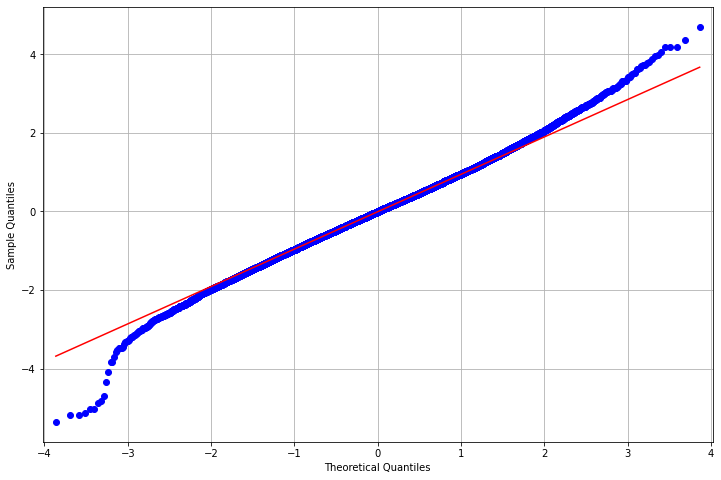

In [20]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
fig = qqplot(arma_mod.resid, line='q', ax=ax, fit=True)
plt.grid()

In [21]:
arma_mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                17920
Model:                     ARMA(5, 3)   Log Likelihood               18247.360
Method:                       css-mle   S.D. of innovations              0.087
Date:                Mon, 08 Jun 2020   AIC                         -36474.719
Time:                        09:07:54   BIC                         -36396.782
Sample:                             0   HQIC                        -36449.084
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3362      0.006     57.629      0.000       0.325       0.348
ar.L1.y        0.6454      0.041     15.791      0.000       0.565       0.725
ar.L2.y       -0.1774      0.047     -3.755      0.000      -0.270      -0.085
ar.L3.y        0.6819      0.025     27.299      0.000       0.633       0.731
ar.L4.y       -0.2525      0.025     -9.971      0.000      -0.302      -0.203
ar.L5.y        0.0242      0.019      1.256      0.209      -0.014       0.062
ma.L1.y        0.1343      0.040      3.340      0.001       0.055       0.213
ma.L2.y       -0.1113      0.033     -3.376      0.001      -0.176      -0.047
ma.L3.y       -0.3212      0.016    -20.653      0.000      -0.352      -0.291
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -0.4961           -1.0952j            1.2023           -0.3177
AR.2           -0.4961           +1.0952j            1.2023            0.3177
AR.3            1.0531           -0.0000j            1.0531           -0.0000
AR.4            5.1883           -0.4860j            5.2110           -0.0149
AR.5            5.1883           +0.4860j            5.2110            0.0149
MA.1           -0.8940           -1.1663j            1.4695           -0.3541
MA.2           -0.8940           +1.1663j            1.4695            0.3541
MA.3            1.4415           -0.0000j            1.4415           -0.0000
-----------------------------------------------------------------------------
"""

In [22]:
index_train_end = H_modules_train_sc.shape[0]
index_val_end = index_train_end + H_modules_val_sc.shape[0]
index_test_end = index_val_end + H_modules_test_sc.shape[0]

H_modules_train_sc_predict = arma_mod.predict(start=0, end=index_train_end-1)
H_modules_val_sc_predict = arma_mod.predict(start=0, end=index_val_end-1)[index_train_end:index_val_end]
H_modules_test_sc_predict = arma_mod.predict(start=0, end=index_test_end-1)[index_val_end:]

print(
    f"Train Train MSE = {count_mse(H_modules_train_sc_predict, H_modules_train_sc)}")
print(
    f"Train Val MSE = {count_mse(H_modules_val_sc_predict, H_modules_val_sc)}")
print(
    f"Train Test MSE = {count_mse(H_modules_test_sc_predict, H_modules_test_sc)}")


print(
    f"Train Train NMSE = {count_nmse(H_modules_train_sc_predict, H_modules_train_sc)}")
print(
    f"Train Val NMSE = {count_nmse(H_modules_val_sc_predict, H_modules_val_sc)}")
print(
    f"Train Test NMSE = {count_nmse(H_modules_test_sc_predict, H_modules_test_sc)}")

Train Train MSE = 0.0076389991570509404
Train Val MSE = 0.023843944191348394
Train Test MSE = 0.02436322890821299
Train Train NMSE = 2.89467757898318
Train Val NMSE = 2.3093427937115094
Train Test NMSE = 6.1301913490275055


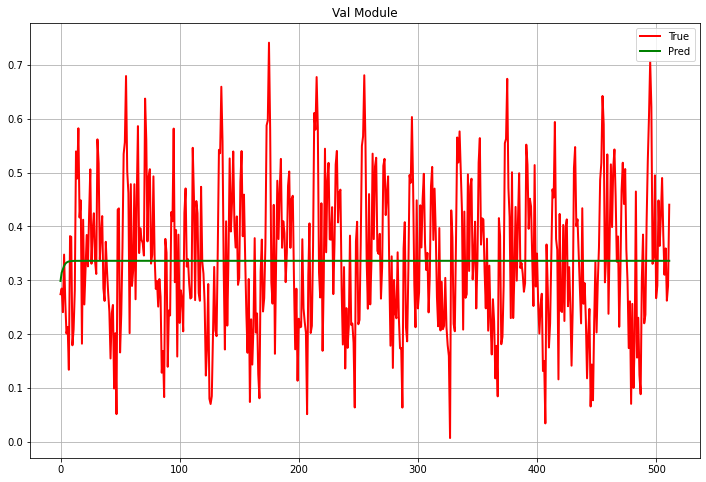

In [23]:
plot_results(H_modules_val_sc, H_modules_val_sc_predict,10,"Val Module")

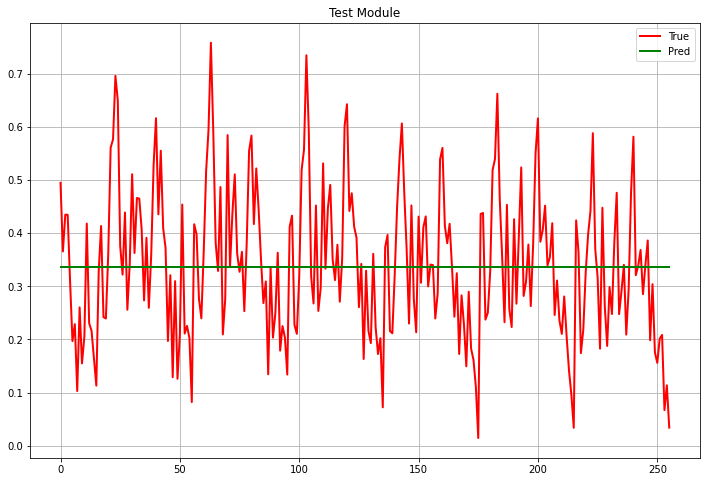

In [24]:
plot_results(H_modules_test_sc, H_modules_test_sc_predict,10,"Test Module")

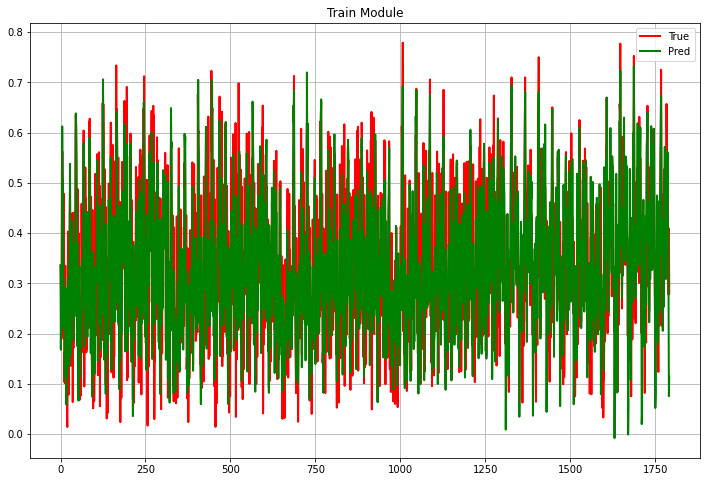

In [25]:
plot_results(H_modules_train_sc, H_modules_train_sc_predict,10,"Train Module")

tried

| P             |  Q              | Losses  |
|:------------- |:---------------:| -------:|
| 5             | 2               |     NAN |
| 5             | 3               |     NAN |
| 10            | 2               |     NAN |
| 100           | 2               |     NAN |

We can see that ARMA model is difficult to predict good results its predictions go to constant level so the model is not good for us, also taking lots of neighbots is difficult to train

In [0]:
# arma_mod = ARMA(H_modules_train_sc, (100,20)).fit(disp=True)
# print(arma_mod.aic, arma_mod.bic)
# print(stats.normaltest(arma_mod.resid))
# arma_mod.summary()

In [0]:
from statsmodels.tsa.arima_process import ArmaProcess

In [0]:
arma_mod.params
ar = np.concatenate(([1.], arma_mod.params[:30]))
ma = np.concatenate(([1.], arma_mod.params[30:]))
arma_t = ArmaProcess(ar, ma)

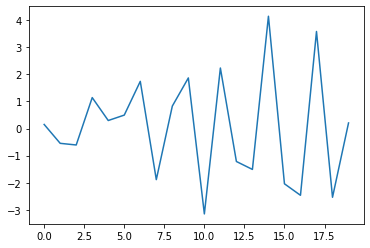

In [29]:
plt.plot(arma_t.generate_sample(nsample=20));

No so good lets try something better, also we can see that MSE is low for constant predictions wich is not good so normalized mse is best for prediction

## One more classic model

In [30]:
!pip install fbprophet

In [0]:
from fbprophet import Prophet
import datetime


In [0]:
def make_data_frame(data):
  base = datetime.datetime.today()
  date_list_past = [base - datetime.timedelta(days=x) for x in range(data.shape[0])]
  date_list_pred = [base + datetime.timedelta(days=x) for x in range(1,data.shape[0]+1)]
  data_train_past = {"ds": date_list_past[::-1], "y" : data}
  
  return pd.DataFrame(data_train_past), pd.DataFrame({"ds": date_list_pred})

In [0]:
H_modules_train_sc, H_modules_train_sc_pred = make_data_frame(get_time_one_seriese(H_modules_train))
H_modules_val_sc, H_modules_val_sc_pred = make_data_frame(get_time_one_seriese(H_modules_val))
H_modules_test_sc, H_modules_test_sc_pred = make_data_frame(get_time_one_seriese(H_modules_test))


In [34]:
probnet = Prophet(daily_seasonality=True)
probnet.fit(H_modules_train_sc)


INFO:numexpr.utils:NumExpr defaulting to 2 threads.


In [0]:
predict_all_up = probnet.predict(H_modules_train_sc_pred)['yhat_upper']
predict_all_low = probnet.predict(H_modules_train_sc_pred)['yhat_lower']
predict_all_mean = probnet.predict(H_modules_train_sc_pred)['yhat']


In [42]:
predict_all_up.shape

(17920,)

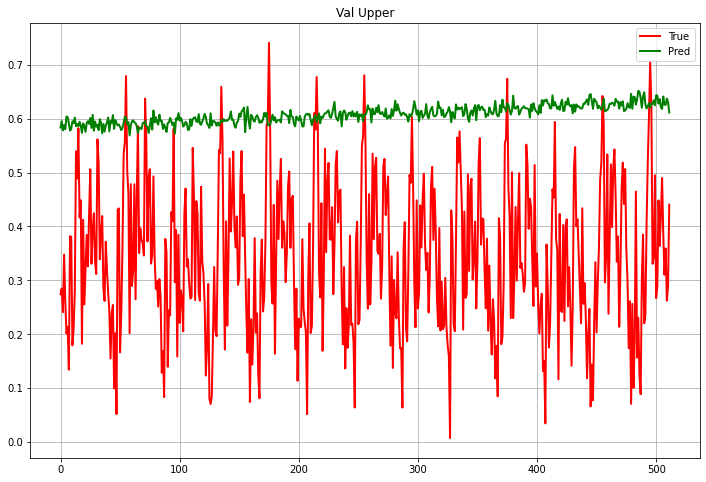

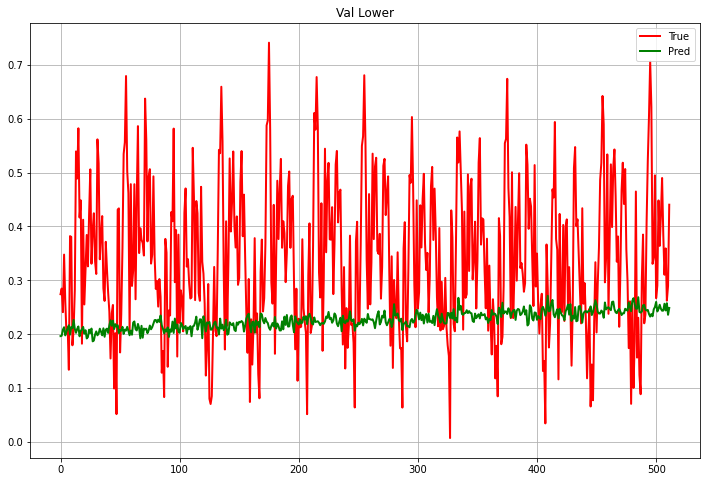

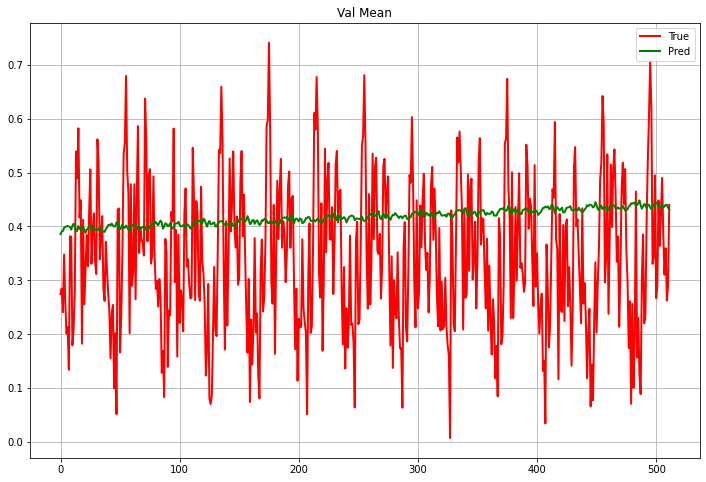

In [47]:
plot_results(H_modules_val_sc['y'].values, predict_all_up.values[:H_modules_val_sc.shape[0]], 10, "Val Upper")
plot_results(H_modules_val_sc['y'].values, predict_all_low.values[:H_modules_val_sc.shape[0]], 10, "Val Lower")
plot_results(H_modules_val_sc['y'].values, predict_all_mean.values[:H_modules_val_sc.shape[0]], 10, "Val Mean")


## LSTM

In [0]:
import torch
import torch.nn as nn
from torch.utils.tensorboard import SummaryWriter
from datetime import datetime


In [0]:
def create_inout_sequences(data, step):
    inout_seq = []
    N = len(data)
    for i in range(N-step):
        train_seq = data[i:i+step]
        train_label = data[i+step:i+step+1]
        inout_seq.append((train_seq, train_label))
    return inout_seq


In [0]:
H_modules_train_sc = torch.FloatTensor(get_time_one_seriese(H_modules_train))
H_modules_val_sc = torch.FloatTensor(get_time_one_seriese(H_modules_val))
H_modules_test_sc = torch.FloatTensor(get_time_one_seriese(H_modules_test))

In [0]:
step = 30
H_modules_train_sc_seq = create_inout_sequences(H_modules_train_sc, step)
H_modules_val_sc_seq = create_inout_sequences(H_modules_val_sc, step)
H_modules_test_sc_seq = create_inout_sequences(H_modules_test_sc, step)

In [0]:
from torch.autograd import Variable


In [0]:
class LSTM(nn.Module):
    def __init__(self, input_size=1, h_hidden=100, output_size=1, n_layers=1):
        super().__init__()
        self.n_layers = n_layers
        self.h_hidden = h_hidden

        self.lstm = nn.LSTM(input_size, h_hidden)

        self.linear = nn.Linear(h_hidden, output_size)

    def forward(self, input_seq):
        h0 = Variable(torch.zeros(self.n_layers, 
                                  1,
                                  self.h_hidden)).to(device)
        h1 = Variable(torch.zeros(self.n_layers, 
                                  1,
                                  self.h_hidden)).to(device)
        lstm_out, _ = self.lstm(input_seq.view(len(input_seq) ,1, -1), (h0,h1)) 
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions[-1]

In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [0]:
def train_duration_epoch(model, data_tensored_x, optimizer, criterion, metric, phase='train', epoch=0, writer=None):
    is_train = (phase == 'train')
    model.to(device)
    if is_train:
        model.train()
    else:
        model.eval()
    
    epoch_loss = 0
    loss = 0
    metrics = 0
    with torch.set_grad_enabled(is_train):
       for i,  [x, y] in enumerate(data_tensored_x):
         x, y = x.to(device), y.to(device)
         
         global_i = len(data_tensored_x) * epoch + i
         pred = model(x)
         
         loss = criterion(pred, y)
        
         if is_train:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

         epoch_loss += loss.item()
        #  print(pred,  y)
         nmse = metric(pred.detach(), y.detach())
         metrics += nmse.item()
         if writer is not None and is_train:
           writer.add_scalar(f"loss/{phase}", loss.item(), global_i)
           writer.add_scalar(f"metric/{phase}",nmse, global_i)
       
       if writer is not None:
        writer.add_scalar(f"loss_epoch/{phase}", epoch_loss / len(data_tensored_x), epoch)
    return  epoch_loss / len(data_tensored_x) , metrics / len(data_tensored_x)

In [0]:
! rm -rf  tb/

In [0]:
%load_ext tensorboard
%tensorboard --logdir tb/

<IPython.core.display.Javascript object>

In [0]:
n_epochs = 1500
model = LSTM()
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
criterio = nn.MSELoss()
metric = count_nmse

In [0]:
writer, experiment_name, best_model_path = setup_experiment(model.__class__.__name__, logdir="./tb")

In [0]:

print(f"Experiment name: {experiment_name}")
best_val_loss = 10000000
for epoch in range(n_epochs):    
    train_loss, train_nmse = train_duration_epoch(model, H_modules_train_sc_seq, optimizer, criterio,metric, phase='train', epoch=epoch, writer=writer)
    print(f'Epoch: {epoch+1}')
    print(f'\tTrain Loss: {train_loss}')
    print(f'\tTrain NMSE: {train_nmse}')
    val_loss, val_nmse = train_duration_epoch(model, H_modules_val_sc_seq, None, criterio,metric, phase='val', epoch=epoch, writer=writer)
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
    # scheduler.step()
    print(f'\tVal. Loss: {val_loss}') 
    print(f'\tVal NMSE: {val_nmse}')

Experiment name: LSTM@02.06.2020-22:24:26
Epoch: 1
	Train Loss: 0.021071176244367235
	Train NMSE: 5.896969247398852
	 Val. Loss: 0.014903768794019842
	Val NMSE: 2.3611792094249417
Epoch: 2
	Train Loss: 0.012725268753421927
	Train NMSE: 6.035862653528151
	 Val. Loss: 0.01264424389078969
	Val NMSE: 2.1627041074461517
Epoch: 3
	Train Loss: 0.01136757627790244
	Train NMSE: 5.149840055227663
	 Val. Loss: 0.012153078077922003
	Val NMSE: 2.1604971207934898
Epoch: 4
	Train Loss: 0.011034941076495892
	Train NMSE: 4.8046139007527575
	 Val. Loss: 0.011845536883251325
	Val NMSE: 2.1256880194401164
Epoch: 5
	Train Loss: 0.010813936921428183
	Train NMSE: 4.662483200035823
	 Val. Loss: 0.011568586536868434
	Val NMSE: 2.0903944562720933
Epoch: 6
	Train Loss: 0.010618139793336185
	Train NMSE: 4.51549799011636
	 Val. Loss: 0.011324481955963174
	Val NMSE: 2.0561132225749814
Epoch: 7
	Train Loss: 0.0104436779132974
	Train NMSE: 4.357147909237402
	 Val. Loss: 0.011112924151902051
	Val NMSE: 2.0235745087095

KeyboardInterrupt: ignored

In [0]:
def pred(model, data):
  model.to(device).eval()
  trues = []
  preds = []
  inputs = data[0][0].numpy()
  for i in range(1, len(data)):
    with torch.no_grad():
        seq = torch.FloatTensor(inputs).to(device)
        # model.hidden = (torch.zeros(1, 1, model.hidden_layer_size),
        #                 torch.zeros(1, 1, model.hidden_layer_size))
        preds.append(model(seq).item())
        # inputs = inputs.detach().cpu().numpy()
        inputs[:-1] = inputs[1:]
        inputs[-1] = preds[-1]
        trues.append(data[i][1].item())
  return trues,preds

In [0]:
H_modules_train_sc, H_modules_train_sc_predict = pred(model, H_modules_train_sc_seq)
H_modules_val_sc, H_modules_val_sc_predict =  pred(model, H_modules_val_sc_seq)
H_modules_test_sc, H_modules_test_sc_predict = pred(model, H_modules_test_sc_seq)

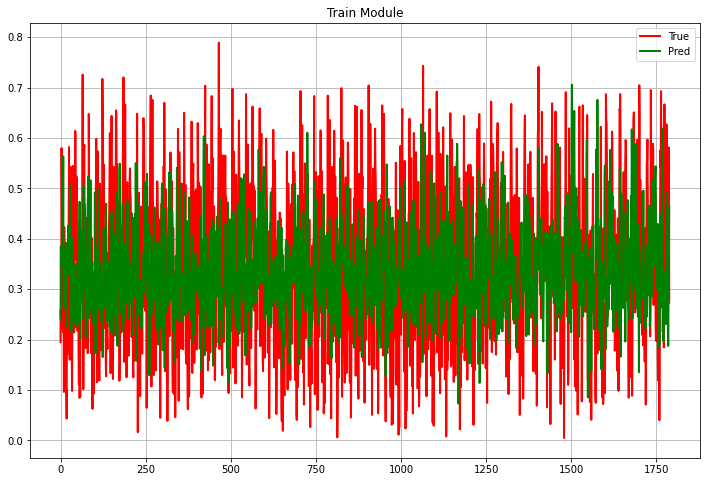

In [0]:
plot_results(H_modules_train_sc, H_modules_train_sc_predict,10,"Train Module")

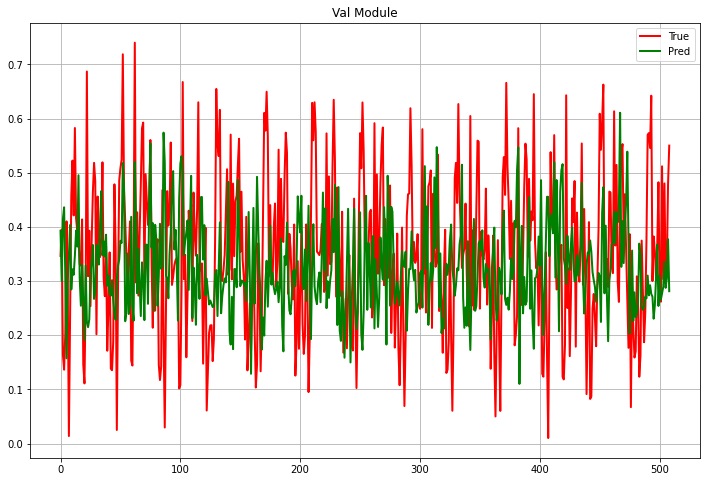

In [0]:
plot_results(H_modules_val_sc, H_modules_val_sc_predict,10,"Val Module")

In [0]:
train_nmse = count_nmse(np.array(H_modules_train_sc), np.array(H_modules_train_sc_predict))
val_nmse = count_nmse(np.array(H_modules_test_sc), np.array(H_modules_test_sc_predict))
test_nmse = count_nmse(np.array(H_modules_val_sc), np.array(H_modules_val_sc_predict))

train_mse = count_mse(np.array(H_modules_train_sc), np.array(H_modules_train_sc_predict))
val_mse = count_mse(np.array(H_modules_test_sc), np.array(H_modules_test_sc_predict))
test_mse = count_mse(np.array(H_modules_val_sc), np.array(H_modules_val_sc_predict))


print(f"Train NMSE {train_nmse}, MSE {train_mse}")
print(f"Val NMSE {val_nmse}, MSE {val_mse}")
print(f"Test NMSE {test_nmse} MSE {test_mse}")

Train NMSE 0.43034801349657514, MSE 0.029859200178665415
Val NMSE 0.46176377244195876, MSE 0.032879382014425064
Test NMSE 0.42528829667633467 MSE 0.03148899916633113


## CovnLSTM

In [0]:
import torch
import torch.nn as nn
from torch.utils.tensorboard import SummaryWriter
from datetime import datetime


In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [0]:
from torch.autograd import Variable


class ConvLSTMCell(nn.Module):
    def __init__(self, input_channels, hidden_channels, kernel_size):
        super(ConvLSTMCell, self).__init__()

        assert hidden_channels % 2 == 0

        self.input_channels = input_channels
        self.hidden_channels = hidden_channels
        self.kernel_size = kernel_size

        self.padding = int((kernel_size - 1) / 2)

        self.Wxi = nn.Conv2d(self.input_channels, self.hidden_channels, self.kernel_size, 1, self.padding, bias=True)
        self.Whi = nn.Conv2d(self.hidden_channels, self.hidden_channels, self.kernel_size, 1, self.padding, bias=False)
        self.Wxf = nn.Conv2d(self.input_channels, self.hidden_channels, self.kernel_size, 1, self.padding, bias=True)
        self.Whf = nn.Conv2d(self.hidden_channels, self.hidden_channels, self.kernel_size, 1, self.padding, bias=False)
        self.Wxc = nn.Conv2d(self.input_channels, self.hidden_channels, self.kernel_size, 1, self.padding, bias=True)
        self.Whc = nn.Conv2d(self.hidden_channels, self.hidden_channels, self.kernel_size, 1, self.padding, bias=False)
        self.Wxo = nn.Conv2d(self.input_channels, self.hidden_channels, self.kernel_size, 1, self.padding, bias=True)
        self.Who = nn.Conv2d(self.hidden_channels, self.hidden_channels, self.kernel_size, 1, self.padding, bias=False)

        self.Wci = None
        self.Wcf = None
        self.Wco = None

    def forward(self, x, h, c):
        ci = torch.sigmoid(self.Wxi(x) + self.Whi(h) + c * self.Wci)
        cf = torch.sigmoid(self.Wxf(x) + self.Whf(h) + c * self.Wcf)
        cc = cf * c + ci * torch.tanh(self.Wxc(x) + self.Whc(h))
        co = torch.sigmoid(self.Wxo(x) + self.Who(h) + cc * self.Wco)
        ch = co * torch.tanh(cc)
        return ch, cc

    def init_hidden(self, batch_size, hidden, shape):
        if self.Wci is None:
            self.Wci = Variable(torch.zeros(1, hidden, shape[0], shape[1],device=device))
            self.Wcf = Variable(torch.zeros(1, hidden, shape[0], shape[1],device=device))
            self.Wco = Variable(torch.zeros(1, hidden, shape[0], shape[1],device=device))
        else:
            assert shape[0] == self.Wci.size()[2], 'Input Height Mismatched!'
            assert shape[1] == self.Wci.size()[3], 'Input Width Mismatched!'
        return (Variable(torch.zeros(batch_size, hidden, shape[0], shape[1],device=device)),
                Variable(torch.zeros(batch_size, hidden, shape[0], shape[1], device=device)))


class ConvLSTM(nn.Module):
    # input_channels corresponds to the first input feature map
    # hidden state is a list of succeeding lstm layers.
    def __init__(self, input_channels=30, hidden_channels=[32,64,128,64,32,16], kernel_size=3, step=1, effective_step=[1]):
        super(ConvLSTM, self).__init__()
        self.input_channels = [input_channels] + hidden_channels
        self.hidden_channels = hidden_channels
        self.kernel_size = kernel_size
        self.num_layers = len(hidden_channels)
        self.step = step
        self.effective_step = effective_step
        self.last = nn.Conv2d(hidden_channels[-1], 1, 1, 1, 0, bias=False)
        self._all_layers = []
        for i in range(self.num_layers):
            name = 'cell{}'.format(i)
            cell = ConvLSTMCell(self.input_channels[i], self.hidden_channels[i], self.kernel_size)
            setattr(self, name, cell)
            self._all_layers.append(cell)
        self._all_layers.append(self.last)
    def forward(self, input):
        internal_state = []
        outputs = []
        for step in range(self.step):
            x = input
            for i in range(self.num_layers):
                # all cells are initialized in the first step
                name = 'cell{}'.format(i)
                if step == 0:
                    bsize, _, height, width = x.size()
                    (h, c) = getattr(self, name).init_hidden(batch_size=bsize, hidden=self.hidden_channels[i],
                                                             shape=(height, width))
                    internal_state.append((h, c))

                # do forward
                (h, c) = internal_state[i]
                x, new_c = getattr(self, name)(x, h, c)
                internal_state[i] = (x, new_c)
            # only record effective steps
            if step in self.effective_step:
                outputs.append(x)
        return  self.last(x)


In [0]:
H_modules_train, H_modules_val, H_modules_test = split_train_val_test(all_H_modules)
H_angulars_train, H_angulars_val, H_angulars_test = split_train_val_test(all_H_angulars)

In [0]:
H_modules_train_tensor = torch.FloatTensor(H_modules_train)
H_modules_val_tensor = torch.FloatTensor(H_modules_val)
H_modules_test_tensor = torch.FloatTensor(H_modules_test)

In [0]:
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader

class DatasetMatrix(Dataset):
    def __init__(self, data, step):
        self.data = data
        self.inout_seq = []
        N = data.shape[-1]
        for i in range(N-step):
          train_seq = data[:,:, i:i+step].permute(2,0,1)
          train_label = data[:,:, i+step:i+step+1].permute(2,0,1)
          self.inout_seq.append((train_seq, train_label))
    def __getitem__(self, index):
        return self.inout_seq[index]

    def __len__(self):
        return len(self.inout_seq)

In [0]:
step = 50
tensor_train_dataset = DatasetMatrix(H_modules_train_tensor, step)
tensor_val_dataset = DatasetMatrix(H_modules_val_tensor, step)
tensor_test_dataset = DatasetMatrix(H_modules_test_tensor, step)


tensor_train_dataloader = DataLoader(tensor_train_dataset, batch_size=30, shuffle=True)
tensor_val_dataloader = DataLoader(tensor_val_dataset, batch_size=30, shuffle=False)
tensor_test_dataloader = DataLoader(tensor_test_dataset, batch_size=1, shuffle=False)

tensor_val1_dataloader = DataLoader(tensor_val_dataset, batch_size=1, shuffle=False)



In [0]:
def train_matrix_epoch(model, data, optimizer, criterion, metric, phase='train', epoch=0, writer=None):
    is_train = (phase == 'train')
    model.to(device)
    if is_train:
        model.train()
    else:
        model.eval()
    
    epoch_loss = 0
    loss = 0
    metrics = 0
    with torch.set_grad_enabled(is_train):
       for i,  [x, y] in enumerate(data):
         x, y = x.to(device), y.to(device)
         
         global_i = len(data) * epoch + i
         pred = model(x)
         loss = criterion(pred, y)
        
         if is_train:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

         epoch_loss += loss.item()
         nmse = metric(pred.detach(), y.detach())
         metrics += nmse.item()
         if writer is not None and is_train:
           writer.add_scalar(f"loss/{phase}", loss.item(), global_i)
           writer.add_scalar(f"metric/{phase}",nmse, global_i)
       
       if writer is not None:
        writer.add_scalar(f"loss_epoch/{phase}", epoch_loss / len(data), epoch)
    return  epoch_loss / len(data) , metrics / len(data)

In [0]:
!rm -rf tb/

In [0]:
%load_ext tensorboard
%tensorboard --logdir tb/

<IPython.core.display.Javascript object>

In [0]:
n_epochs = 500
model = ConvLSTM(input_channels=step)
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterio = nn.MSELoss()
metric = count_nmse

In [0]:
writer, experiment_name, best_model_path = setup_experiment(model.__class__.__name__, logdir="./tb")

In [0]:
print(f"Experiment name: {experiment_name}")
best_val_loss = 10000000
for epoch in range(n_epochs):    
    train_loss, train_nmse = train_matrix_epoch(model, tensor_train_dataloader, optimizer, criterio, metric, phase='train', epoch=epoch, writer=writer)
    print(f'Epoch: {epoch+1}')
    print(f'\tTrain Loss: {train_loss}')
    print(f'\tTrain NMSE: {train_nmse}')
    val_loss, val_nmse = train_matrix_epoch(model, tensor_val_dataloader, None, criterio,metric, phase='val', epoch=epoch, writer=writer)
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
    # scheduler.step()
    print(f'\tVal. Loss: {val_loss}') 
    print(f'\tVal NMSE: {val_nmse}')

Experiment name: ConvLSTM@03.06.2020-21:51:53
Epoch: 1
	Train Loss: 0.06466682461500667
	Train NMSE: 11.034876481572187
	Val. Loss: 0.027260769980356973
	Val NMSE: 5.803223902337692
Epoch: 2
	Train Loss: 0.023900983118806254
	Train NMSE: 8.247905347714672
	Val. Loss: 0.02151045831029906
	Val NMSE: 5.244098100942724
Epoch: 3
	Train Loss: 0.020878297549795664
	Train NMSE: 7.314303685173118
	Val. Loss: 0.019734301976859568
	Val NMSE: 4.712518970054739
Epoch: 4
	Train Loss: 0.01992771132588636
	Train NMSE: 7.358214384447191
	Val. Loss: 0.019274964490357566
	Val NMSE: 4.982646230564398
Epoch: 5
	Train Loss: 0.01947134047578178
	Train NMSE: 6.913541258379842
	Val. Loss: 0.019150761788820518
	Val NMSE: 4.494504353053429
Epoch: 6
	Train Loss: 0.01929835843349771
	Train NMSE: 7.0320550566242765
	Val. Loss: 0.018872985972420257
	Val NMSE: 4.334419324994087
Epoch: 7
	Train Loss: 0.019122310898499174
	Train NMSE: 7.1553850999130075
	Val. Loss: 0.019177790183354828
	Val NMSE: 4.305221581196084
Epoc

In [0]:
def pred(model, data):
  model.to(device).eval()

  for i,  [x, y] in enumerate(data):
    y =  y.cpu().squeeze(0).numpy()
    if i == 0:
      trues =y
    else:
      trues = np.concatenate((trues, y))
    with torch.no_grad():
        x = x.to(device)
        x = model(x).detach().cpu().squeeze(0).numpy()
        if i == 0:
          preds = x
        else:
          preds = np.concatenate((preds, x))
  return trues.transpose(1,2,0), preds.transpose(1,2,0)

In [0]:
channel_true_test, channel_pred_test = pred(model, tensor_test_dataloader)

channel_true_val, channel_pred_val = pred(model, tensor_val1_dataloader)



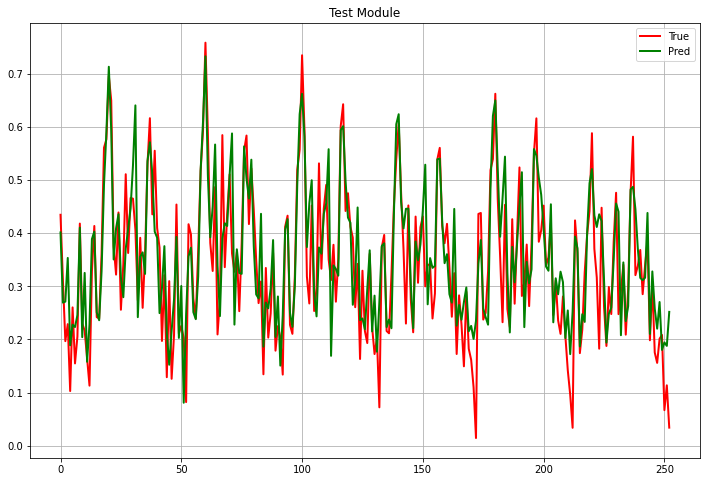

In [0]:
plot_results(channel_true_test[0,0], channel_pred_test[0,0],10,"Test Module")

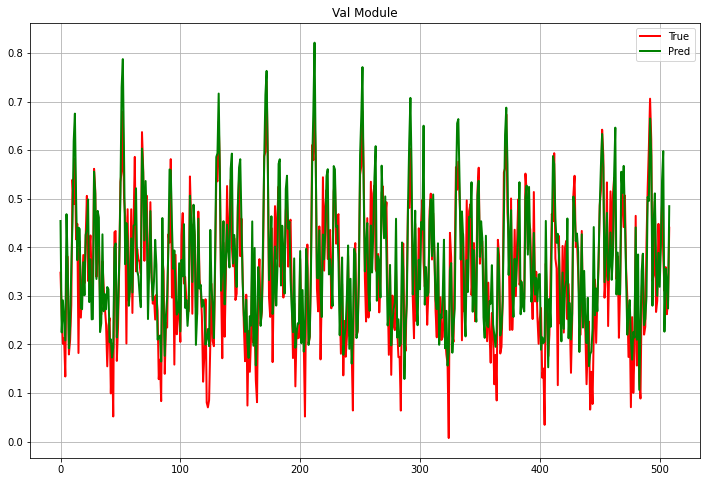

In [0]:
plot_results(channel_true_val[0,0], channel_pred_val[0,0],10,"Val Module")

In [0]:
print(f"Test MSE on 0,0 {count_mse(channel_pred_test[0,0],channel_true_test[0,0])}")
print(f"Test  MSE all {count_mse(channel_pred_test,channel_true_test)}")


print(f"Val MSE on 0,0 {count_mse(channel_true_val[0,0],channel_pred_val[0,0])}")
print(f"Val MSE all {count_mse(channel_true_val,channel_pred_val)}")

Test MSE on 0,0 0.00875009037554264
Test  MSE all 0.012011485174298286
Val MSE on 0,0 0.007562194485217333
Val MSE all 0.009094905108213425


In [0]:
channel_true_test - channel_pred_test

array([[[ 3.31760645e-02, -6.15219474e-02,  1.45745277e-02, ...,
          1.80057555e-01, -4.00871038e-03,  4.21125591e-02],
        [ 7.46080577e-02, -3.40921283e-02,  7.02657998e-02, ...,
          7.90032744e-02, -1.34836048e-01,  1.29072070e-02],
        [ 1.33772582e-01, -7.81768560e-03,  1.44587040e-01, ...,
          6.99263811e-02, -1.56915873e-01, -2.21722722e-02],
        ...,
        [ 5.14032543e-02, -1.10554427e-01, -8.49184841e-02, ...,
         -1.14664853e-01,  9.09527987e-02, -1.14791363e-01],
        [-1.21111274e-02, -8.28723907e-02, -4.77049500e-02, ...,
         -9.76195037e-02,  1.67897940e-02, -1.35525733e-01],
        [-1.34945512e-02, -6.79750890e-02, -8.43598247e-02, ...,
         -9.25553441e-02, -1.96157843e-02, -1.02623522e-01]],

       [[ 6.35958910e-02,  9.29792821e-02,  7.63589144e-02, ...,
          4.82702181e-02,  1.15378752e-01, -7.72904605e-02],
        [-1.59085989e-02, -9.15738940e-03,  3.27279270e-02, ...,
          1.16185494e-01,  1.51418000e

In [0]:
print(f"Experiment name: {experiment_name}")
best_val_loss = 10000000
for epoch in range(n_epochs, 2*n_epochs):    
    train_loss, train_nmse = train_matrix_epoch(model, tensor_train_dataloader, optimizer, criterio, metric, phase='train', epoch=epoch, writer=writer)
    print(f'Epoch: {epoch+1}')
    print(f'\tTrain Loss: {train_loss}')
    print(f'\tTrain NMSE: {train_nmse}')
    val_loss, val_nmse = train_matrix_epoch(model, tensor_val_dataloader, None, criterio,metric, phase='val', epoch=epoch, writer=writer)
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
    # scheduler.step()
    print(f'\tVal. Loss: {val_loss}') 
    print(f'\tVal NMSE: {val_nmse}')

Experiment name: ConvLSTM@03.06.2020-21:51:53
Epoch: 501
	Train Loss: 0.005154640747661666
	Train NMSE: 1.2816165235873243
	Val. Loss: 0.00900606884730651
	Val NMSE: 1.5663520071874646
Epoch: 502
	Train Loss: 0.005139600220362545
	Train NMSE: 1.34004195416393
	Val. Loss: 0.009000504729064072
	Val NMSE: 1.5197990239981343
Epoch: 503
	Train Loss: 0.005142427851419453
	Train NMSE: 1.4310393791951526
	Val. Loss: 0.008973253227989463
	Val NMSE: 1.5256479848833646
Epoch: 504
	Train Loss: 0.005131114019982679
	Train NMSE: 1.4254621639722955
	Val. Loss: 0.00893372349879321
	Val NMSE: 1.4901621655944515
Epoch: 505
	Train Loss: 0.005129522847563927
	Train NMSE: 1.2001936531046926
	Val. Loss: 0.008948201842277365
	Val NMSE: 1.5399678845615947
Epoch: 506
	Train Loss: 0.005120275836980822
	Train NMSE: 1.3123263413308055
	Val. Loss: 0.008938722852069666
	Val NMSE: 1.5485402996487476
Epoch: 507
	Train Loss: 0.005111933167137742
	Train NMSE: 1.332612503388619
	Val. Loss: 0.009072902727433864
	Val NMSE

In [0]:
n_epochs = 500
model = ConvLSTM(input_channels=step)
loss_function = nn.MSELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-6)
criterio = nn.MSELoss()
metric = count_nmse
writer, experiment_name, best_model_path = setup_experiment(model.__class__.__name__, logdir="./tb")

In [0]:
print(f"Experiment name: {experiment_name}")
best_val_loss = 10000000
for epoch in range(n_epochs):    
    train_loss, train_nmse = train_matrix_epoch(model, tensor_train_dataloader, optimizer, criterio, metric, phase='train', epoch=epoch, writer=writer)
    print(f'Epoch: {epoch+1}')
    print(f'\tTrain Loss: {train_loss}')
    print(f'\tTrain NMSE: {train_nmse}')
    val_loss, val_nmse = train_matrix_epoch(model, tensor_val_dataloader, None, criterio,metric, phase='val', epoch=epoch, writer=writer)
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
    # scheduler.step()
    print(f'\tVal. Loss: {val_loss}') 
    print(f'\tVal NMSE: {val_nmse}')

Experiment name: ConvLSTM@04.06.2020-22:58:04
Epoch: 1
	Train Loss: 0.08336705680711558
	Train NMSE: 30.121546734899482
	Val. Loss: 0.06722557535890997
	Val NMSE: 15.287468729287209
Epoch: 2
	Train Loss: 0.07932630768233298
	Train NMSE: 30.759874611892958
	Val. Loss: 0.06788926496660921
	Val NMSE: 16.822811886050996
Epoch: 3
	Train Loss: 0.05879068023356415
	Train NMSE: 26.20583646399463
	Val. Loss: 0.024330107125966154
	Val NMSE: 3.7909395828754944
Epoch: 4
	Train Loss: 0.019707732521397556
	Train NMSE: 7.348485365910018
	Val. Loss: 0.020408328121098187
	Val NMSE: 3.36275855562038
Epoch: 5
	Train Loss: 0.017166989742959507
	Train NMSE: 6.08091769772488
	Val. Loss: 0.016962496189058884
	Val NMSE: 4.611547714154396
Epoch: 6
	Train Loss: 0.015948703137520177
	Train NMSE: 5.479659252118744
	Val. Loss: 0.016351742151926255
	Val NMSE: 4.221996195217561
Epoch: 7
	Train Loss: 0.01490514155714804
	Train NMSE: 5.2432619096248745
	Val. Loss: 0.01595543381708437
	Val NMSE: 3.6300566188506123
Epoc

KeyboardInterrupt: ignored

Test MSE on 0,0 0.005641617812216282
Test  MSE all 0.010956811718642712
Val MSE on 0,0 0.004161940887570381
Val MSE all 0.006977506913244724


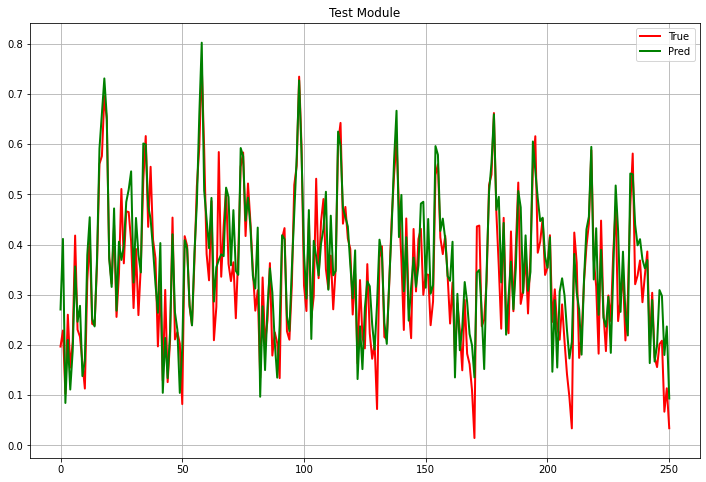

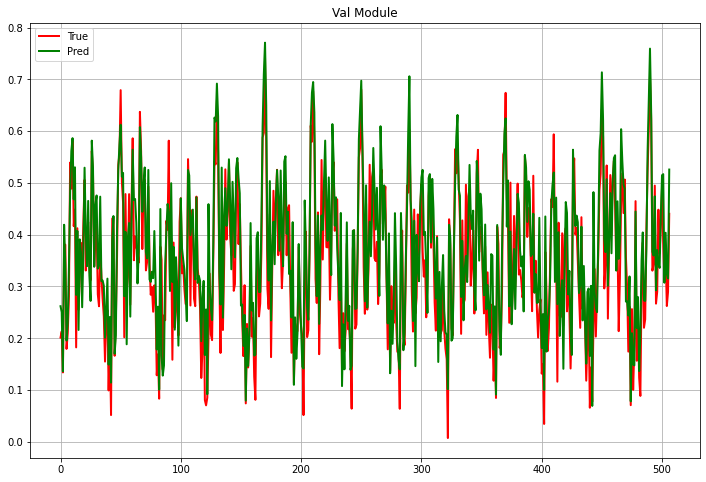

In [0]:
channel_true_test, channel_pred_test = pred(model, tensor_test_dataloader)

channel_true_val, channel_pred_val = pred(model, tensor_val1_dataloader)
plot_results(channel_true_test[0,0], channel_pred_test[0,0],10,"Test Module")
plot_results(channel_true_val[0,0], channel_pred_val[0,0],10,"Val Module")
print(f"Test MSE on 0,0 {count_mse(channel_pred_test[0,0],channel_true_test[0,0])}")
print(f"Test  MSE all {count_mse(channel_pred_test,channel_true_test)}")


print(f"Val MSE on 0,0 {count_mse(channel_true_val[0,0],channel_pred_val[0,0])}")
print(f"Val MSE all {count_mse(channel_true_val,channel_pred_val)}")

# Manifolds

In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import einsum


class AttentionConv2d(nn.Module):
    def __init__(self, input_dim, output_dim, dk, dv, num_heads, kernel_size, padding, rel_encoding=False, height=4, width=312):
        super(AttentionConv2d, self).__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.dk = dk
        self.dv = dv
        self.num_heads = num_heads
        self.kernel_size = kernel_size
        self.dkh = self.dk // self.num_heads
        if rel_encoding and not height:
            raise("Cannot use relative encoding without specifying input's height and width")
        self.H = height
        self.W = width
        self.conv_qkv = nn.Conv2d(input_dim, 2*dk + dv, 1)
        self.conv_attn = nn.Conv2d(dv, dv, 1)
        self.conv_out = nn.Conv2d(input_dim, output_dim - dv, kernel_size, padding=padding)
        self.softmax = nn.Softmax(dim=-1)
        self.key_rel_w = nn.Parameter(self.dkh**-0.5 + torch.rand(2*width-1, self.dkh), requires_grad=True)
        self.key_rel_h = nn.Parameter(self.dkh**-0.5 + torch.rand(2*height-1, self.dkh), requires_grad=True)
        self.relative_encoding = rel_encoding
        

    def forward(self, input):
        conv_out = self.conv_out(input)

        qkv = self.conv_qkv(input)    # batch_size, 2*dk+dv, H, W
        
        q, k, v = torch.split(qkv, [self.dk, self.dk, self.dv], dim=1)
        
        batch_size, _, H, W = q.size()
        print(qkv.shape)
        print(self.dk, self.dv)
        q = q.view([batch_size, self.num_heads, self.dk // self.num_heads, H*W])
        k = k.view([batch_size, self.num_heads, self.dk // self.num_heads, H*W])
        v = v.view([batch_size, self.num_heads, self.dv // self.num_heads, H*W])

        q *= self.dkh ** -0.5
        logits = einsum('ijkl, ijkm -> ijlm', q, k)
        if self.relative_encoding:
            h_rel_logits, w_rel_logits = self._relative_logits(q)
            logits += h_rel_logits
            logits += w_rel_logits

        weights = self.softmax(logits)
        attn_out = einsum('ijkl, ijfl -> ijfk', weights, v)
        attn_out = attn_out.contiguous().view(batch_size, self.dv, H, W)
        attn_out = self.conv_attn(attn_out)
        output = torch.cat([conv_out, attn_out], dim=1)

        return output

    def _relative_logits(self, q):
        b, nh, dkh, _ = q.size()
        q = q.view(b, nh, dkh, self.H, self.W)

        rel_logits_w = self._relative_logits1d(q, self.key_rel_w, self.H, self.W, nh, [0, 1, 2, 4, 3, 5])
        rel_logits_h = self._relative_logits1d(q.permute(0, 1, 2, 4, 3), self.key_rel_h, self.W, self.H, nh, [0, 1, 4, 2, 5, 3])
        return rel_logits_h, rel_logits_w

    def _relative_logits1d(self, q, rel_k, H, W, Nh, transpose_mask):
        rel_logits = einsum('bhdxy, md -> bhxym', q, rel_k)

        rel_logits = rel_logits.view([-1, Nh*H, W, 2*W-1])
        rel_logits = self._rel_to_abs(rel_logits)
        rel_logits = rel_logits.view([-1, Nh, H, W, W]).unsqueeze(dim=3).repeat([1,1,1,H,1,1])
        rel_logits = rel_logits.permute(*transpose_mask)
        rel_logits = rel_logits.contiguous().view(-1, Nh, H*W, H*W)
        return rel_logits

    def _rel_to_abs(self, x):
        b, nh, l, _ = x.size()


        x = F.pad(x, (0,1), 'constant', 0)
        flat_x = x.view([b, nh, l*(2*l)]);
        flat_x_padded = F.pad(flat_x, (0, l-1), 'constant', 0)

        final_x = flat_x_padded.view([b, nh, l+1, 2*l-1])
        final_x = final_x[:, :, :l, l-1:]

        return final_x

In [0]:
from torch.autograd import Variable


class ConvLSTMCell(nn.Module):
    def __init__(self, input_channels, hidden_channels, kernel_size,num_heads=2):
        super(ConvLSTMCell, self).__init__()

        assert hidden_channels % 2 == 0

        self.input_channels = input_channels
        self.hidden_channels = hidden_channels
        self.kernel_size = kernel_size

        self.padding = int((kernel_size - 1) / 2)
        dk = int(0.1 * hidden_channels)
        dv = int(0.2 * hidden_channels)
        self.Wxi = AttentionConv2d(self.input_channels, self.hidden_channels,dk,dv, num_heads,self.kernel_size,self.padding,)
        self.Whi = AttentionConv2d(self.hidden_channels, self.hidden_channels,dk,dv,num_heads, self.kernel_size,self.padding,3,3)
        self.Wxf = AttentionConv2d(self.input_channels, self.hidden_channels,dk,dv,num_heads, self.kernel_size,self.padding,)
        self.Whf = AttentionConv2d(self.hidden_channels, self.hidden_channels,dk,dv,num_heads,self.kernel_size, self.padding, )
        self.Wxc = AttentionConv2d(self.input_channels, self.hidden_channels,dk,dv,num_heads, self.kernel_size,self.padding,)
        self.Whc = AttentionConv2d(self.hidden_channels, self.hidden_channels,dk,dv,num_heads, self.kernel_size, self.padding, )
        self.Wxo = AttentionConv2d(self.input_channels, self.hidden_channels,dk,dv,num_heads, self.kernel_size,self.padding,)
        self.Who = AttentionConv2d(self.hidden_channels, self.hidden_channels,dk,dv, num_heads,self.kernel_size,self.padding)

        self.Wci = None
        self.Wcf = None
        self.Wco = None

    def forward(self, x, h, c):
        print(x.shape)
        print(self.Wxi(x).shape)
        print(self.Whi(x).shape)
        print(self.Wci(x).shape)
        ci = torch.sigmoid(self.Wxi(x) + self.Whi(h) + c * self.Wci)
        cf = torch.sigmoid(self.Wxf(x) + self.Whf(h) + c * self.Wcf)
        cc = cf * c + ci * torch.tanh(self.Wxc(x) + self.Whc(h))
        co = torch.sigmoid(self.Wxo(x) + self.Who(h) + cc * self.Wco)
        ch = co * torch.tanh(cc)
        return ch, cc

    def init_hidden(self, batch_size, hidden, shape):
        if self.Wci is None:
            self.Wci = Variable(torch.zeros(1, hidden, shape[0], shape[1],device=device))
            self.Wcf = Variable(torch.zeros(1, hidden, shape[0], shape[1],device=device))
            self.Wco = Variable(torch.zeros(1, hidden, shape[0], shape[1],device=device))
        else:
            assert shape[0] == self.Wci.size()[2], 'Input Height Mismatched!'
            assert shape[1] == self.Wci.size()[3], 'Input Width Mismatched!'
        return (Variable(torch.zeros(batch_size, hidden, shape[0], shape[1],device=device)),
                Variable(torch.zeros(batch_size, hidden, shape[0], shape[1], device=device)))


class ConvLSTM(nn.Module):
    # input_channels corresponds to the first input feature map
    # hidden state is a list of succeeding lstm layers.
    def __init__(self, input_channels=30, hidden_channels=[64,128], kernel_size=3, step=1, effective_step=[1]):
        super(ConvLSTM, self).__init__()
        self.input_channels = [input_channels] + hidden_channels
        self.hidden_channels = hidden_channels
        self.kernel_size = kernel_size
        self.num_layers = len(hidden_channels)
        self.step = step
        self.effective_step = effective_step
        self.last = nn.Conv2d(hidden_channels[-1], 1, 1, 1, 0, bias=False)
        self._all_layers = []
        for i in range(self.num_layers):
            name = 'cell{}'.format(i)
            cell = ConvLSTMCell(self.input_channels[i], self.hidden_channels[i], self.kernel_size)
            setattr(self, name, cell)
            self._all_layers.append(cell)
        self._all_layers.append(self.last)
    def forward(self, input):
        internal_state = []
        outputs = []
        for step in range(self.step):
            x = input
            for i in range(self.num_layers):
                # all cells are initialized in the first step
                name = 'cell{}'.format(i)
                if step == 0:
                    bsize, _, height, width = x.size()
                    (h, c) = getattr(self, name).init_hidden(batch_size=bsize, hidden=self.hidden_channels[i],
                                                             shape=(height, width))
                    internal_state.append((h, c))

                # do forward
                (h, c) = internal_state[i]
                x, new_c = getattr(self, name)(x, h, c)
                internal_state[i] = (x, new_c)
            # only record effective steps
            if step in self.effective_step:
                outputs.append(x)
        return  self.last(x)


In [0]:
step = 30
tensor_train_dataset = DatasetMatrix(H_modules_train_tensor, step)
tensor_val_dataset = DatasetMatrix(H_modules_val_tensor, step)
tensor_test_dataset = DatasetMatrix(H_modules_test_tensor, step)


tensor_train_dataloader = DataLoader(tensor_train_dataset, batch_size=30, shuffle=True)
tensor_val_dataloader = DataLoader(tensor_val_dataset, batch_size=30, shuffle=False)
tensor_test_dataloader = DataLoader(tensor_test_dataset, batch_size=1, shuffle=False)

tensor_val1_dataloader = DataLoader(tensor_val_dataset, batch_size=1, shuffle=False)



In [0]:
%load_ext tensorboard
%tensorboard --logdir tb/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 41161), started 0:21:27 ago. (Use '!kill 41161' to kill it.)

<IPython.core.display.Javascript object>

In [0]:
n_epochs = 500
model = ConvLSTM(input_channels=step)
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterio = nn.MSELoss()
metric = count_nmse
writer, experiment_name, best_model_path = setup_experiment(model.__class__.__name__, logdir="./tb")

In [0]:
model.to(device)
for x,y in tensor_train_dataloader:
  x= x.to(device)
  model(x)
  break


torch.Size([30, 30, 4, 312])
torch.Size([30, 24, 4, 312])
6 12
torch.Size([30, 64, 4, 312])


RuntimeError: ignored

In [0]:
print(f"Experiment name: {experiment_name}")
best_val_loss = 10000000
for epoch in range(n_epochs, 2*n_epochs):    
    train_loss, train_nmse = train_matrix_epoch(model, tensor_train_dataloader, optimizer, criterio, metric, phase='train', epoch=epoch, writer=writer)
    print(f'Epoch: {epoch+1}')
    print(f'\tTrain Loss: {train_loss}')
    print(f'\tTrain NMSE: {train_nmse}')
    val_loss, val_nmse = train_matrix_epoch(model, tensor_val_dataloader, None, criterio,metric, phase='val', epoch=epoch, writer=writer)
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
    # scheduler.step()
    print(f'\tVal. Loss: {val_loss}') 
    print(f'\tVal NMSE: {val_nmse}')